- [Data wrangling](#Data wrangling)
- [Data Visualization](#Data Visualization)
- [Applying Inferential Statistics](#Applying Inferential Statistics)
- [More Data Wrangling](#More Data Wrangling)
- [Merging Data](#Merging Data)
- [Evaluation Metric](#Evaluation Metric)
- [Modeling](#Modeling)


In [175]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import math
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
from statsmodels.stats.weightstats import ztest
from statsmodels.stats.proportion import proportions_ztest
from sklearn import linear_model, metrics, preprocessing, model_selection
from fancyimpute import IterativeImputer
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense, Flatten, BatchNormalization
from keras.callbacks import EarlyStopping
import numpy as np
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import make_scorer

Data source: https://www.kaggle.com/c/airbnb-recruiting-new-user-bookings/data

In [2]:
df_train = pd.read_csv('data/train_users_2.csv', parse_dates=['date_account_created', 'date_first_booking'])
df_test = pd.read_csv('data/test_users.csv', parse_dates=['date_account_created', 'date_first_booking'])
df_age_gen = pd.read_csv('data/age_gender_bkts.csv')
df_country = pd.read_csv('data/countries.csv')
df_session = pd.read_csv('data/sessions.csv')

<a id='Data wrangling'></a>

# Data wrangling

### Train & Test data

In [3]:
df_train.columns

Index(['id', 'date_account_created', 'timestamp_first_active',
       'date_first_booking', 'gender', 'age', 'signup_method', 'signup_flow',
       'language', 'affiliate_channel', 'affiliate_provider',
       'first_affiliate_tracked', 'signup_app', 'first_device_type',
       'first_browser', 'country_destination'],
      dtype='object')

In [4]:
df_test.columns

Index(['id', 'date_account_created', 'timestamp_first_active',
       'date_first_booking', 'gender', 'age', 'signup_method', 'signup_flow',
       'language', 'affiliate_channel', 'affiliate_provider',
       'first_affiliate_tracked', 'signup_app', 'first_device_type',
       'first_browser'],
      dtype='object')

In [5]:
df_train.shape

(213451, 16)

In [6]:
df_test.shape

(62096, 15)

In [7]:
df_test['date_first_booking'].isnull().sum()

62096

In [8]:
df_train['test'] = 0
df_test['test'] = 1

In [9]:
df = pd.concat([df_train, df_test], axis=0)

/Users/arielyeung/anaconda2/envs/py365/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




In [10]:
df['timestamp_first_active'] = pd.to_datetime(df['timestamp_first_active'], format='%Y%m%d%H%M%S')

In [11]:
df.replace('-unknown-', np.nan, inplace=True)

In [12]:
df.head()

,affiliate_channel,affiliate_provider,age,country_destination,date_account_created,date_first_booking,first_affiliate_tracked,first_browser,first_device_type,gender,id,language,signup_app,signup_flow,signup_method,test,timestamp_first_active
0,direct,direct,NaN,NDF,2010-06-28,NaT,untracked,Chrome,Mac Desktop,NaN,gxn3p5htnn,en,Web,0,facebook,0,2009-03-19 04:32:55
1,seo,google,38.0,NDF,2011-05-25,NaT,untracked,Chrome,Mac Desktop,MALE,820tgsjxq7,en,Web,0,facebook,0,2009-05-23 17:48:09
2,direct,direct,56.0,US,2010-09-28,2010-08-02,untracked,IE,Windows Desktop,FEMALE,4ft3gnwmtx,en,Web,3,basic,0,2009-06-09 23:12:47
3,direct,direct,42.0,other,2011-12-05,2012-09-08,untracked,Firefox,Mac Desktop,FEMALE,bjjt8pjhuk,en,Web,0,facebook,0,2009-10-31 06:01:29
4,direct,direct,41.0,US,2010-09-14,2010-02-18,untracked,Chrome,Mac Desktop,NaN,87mebub9p4,en,Web,0,basic,0,2009-12-08 06:11:05


In [13]:
len(df) == len(df['id'].unique())

True

In [14]:
df.isnull().sum()

affiliate_channel               0
affiliate_provider              0
age                        116866
country_destination         62096
date_account_created            0
date_first_booking         186639
first_affiliate_tracked      6085
first_browser               44394
first_device_type               0
gender                     129480
id                              0
language                        1
signup_app                      0
signup_flow                     0
signup_method                   0
test                            0
timestamp_first_active          0
dtype: int64

In [15]:
print(df['date_account_created'].max())
print(df['date_account_created'].min())

2014-09-30 00:00:00
2010-01-01 00:00:00


In [16]:
print(df['timestamp_first_active'].max())
print(df['timestamp_first_active'].min())

2014-09-30 23:59:01
2009-03-19 04:32:55


In [17]:
print(df['date_first_booking'].dropna().max())
print(df['date_first_booking'].dropna().min())

2015-06-29 00:00:00
2010-01-02 00:00:00


In [18]:
df[df['date_account_created'] > df['date_first_booking']].head()

,affiliate_channel,affiliate_provider,age,country_destination,date_account_created,date_first_booking,first_affiliate_tracked,first_browser,first_device_type,gender,id,language,signup_app,signup_flow,signup_method,test,timestamp_first_active
2,direct,direct,56.0,US,2010-09-28,2010-08-02,untracked,IE,Windows Desktop,FEMALE,4ft3gnwmtx,en,Web,3,basic,0,2009-06-09 23:12:47
4,direct,direct,41.0,US,2010-09-14,2010-02-18,untracked,Chrome,Mac Desktop,NaN,87mebub9p4,en,Web,0,basic,0,2009-12-08 06:11:05
120,direct,direct,NaN,US,2010-05-30,2010-03-17,omg,Safari,Mac Desktop,FEMALE,swrvyedlsp,en,Web,0,facebook,0,2010-02-18 00:41:09
357,direct,direct,38.0,US,2010-12-23,2010-04-06,untracked,Firefox,Mac Desktop,MALE,adq42kzmnv,en,Web,2,basic,0,2010-04-05 15:35:24
365,direct,direct,44.0,US,2011-03-28,2010-04-15,untracked,Firefox,Mac Desktop,FEMALE,176898y1ju,en,Web,0,basic,0,2010-04-06 19:02:10


In [19]:
len(df[df['date_account_created'] > df['date_first_booking']]) / len(df)

0.00010524520317767931

In [20]:
df['date_account_created'] = np.where(df['date_account_created'] > df['date_first_booking'], 
                                      df['date_first_booking'], df['date_account_created'])

In [21]:
df[df['date_account_created'] > df['date_first_booking']]

,affiliate_channel,affiliate_provider,age,country_destination,date_account_created,date_first_booking,first_affiliate_tracked,first_browser,first_device_type,gender,id,language,signup_app,signup_flow,signup_method,test,timestamp_first_active


In [22]:
df.describe()

,age,signup_flow,test
count,158681.000000,275547.000000,275547.000000
mean,47.145310,4.291965,0.225355
std,142.629468,8.794313,0.417817
min,1.000000,0.000000,0.000000
25%,28.000000,0.000000,0.000000
50%,33.000000,0.000000,0.000000
75%,42.000000,1.000000,0.000000
max,2014.000000,25.000000,1.000000


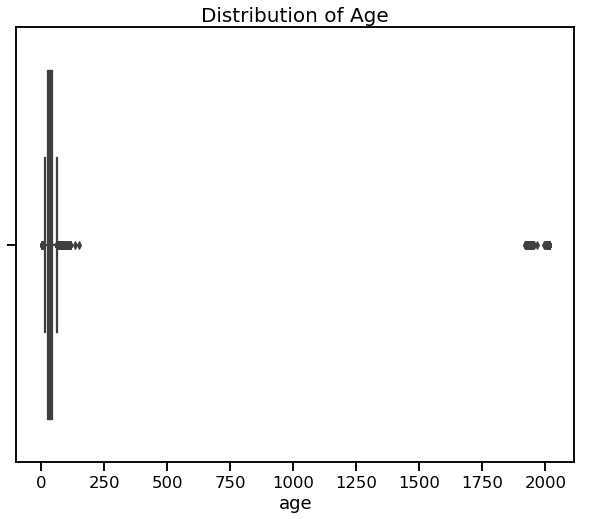

In [23]:
sns.set_context('talk')
plt.figure(figsize=(10, 8))
sns.boxplot(x='age', data=df)
plt.title('Distribution of Age', fontsize=20);

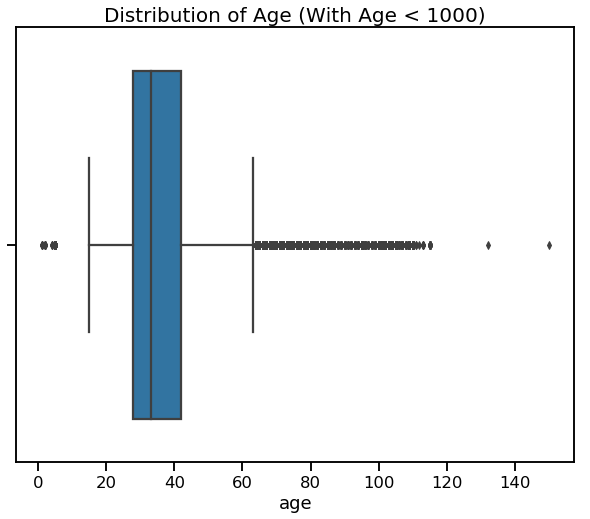

In [24]:
plt.figure(figsize=(10, 8))
sns.boxplot(x='age', data=df[df['age'] < 1000])
plt.title('Distribution of Age (With Age < 1000)', fontsize=20);

In [25]:
len(df[df['age'] > 100]) / len(df)

0.009762399880964046

In [26]:
len(df[df['age'] < 18]) / len(df)

0.0006822792481863348

In [27]:
df.loc[df['age'] < 18, 'age'] = 18

In [28]:
df.loc[df['age'] > 100, 'age'] = 100

In [29]:
df[(df['age'] < 18) | (df['age'] > 100)]

,affiliate_channel,affiliate_provider,age,country_destination,date_account_created,date_first_booking,first_affiliate_tracked,first_browser,first_device_type,gender,id,language,signup_app,signup_flow,signup_method,test,timestamp_first_active


In [30]:
df.head()

,affiliate_channel,affiliate_provider,age,country_destination,date_account_created,date_first_booking,first_affiliate_tracked,first_browser,first_device_type,gender,id,language,signup_app,signup_flow,signup_method,test,timestamp_first_active
0,direct,direct,NaN,NDF,2010-06-28,NaT,untracked,Chrome,Mac Desktop,NaN,gxn3p5htnn,en,Web,0,facebook,0,2009-03-19 04:32:55
1,seo,google,38.0,NDF,2011-05-25,NaT,untracked,Chrome,Mac Desktop,MALE,820tgsjxq7,en,Web,0,facebook,0,2009-05-23 17:48:09
2,direct,direct,56.0,US,2010-08-02,2010-08-02,untracked,IE,Windows Desktop,FEMALE,4ft3gnwmtx,en,Web,3,basic,0,2009-06-09 23:12:47
3,direct,direct,42.0,other,2011-12-05,2012-09-08,untracked,Firefox,Mac Desktop,FEMALE,bjjt8pjhuk,en,Web,0,facebook,0,2009-10-31 06:01:29
4,direct,direct,41.0,US,2010-02-18,2010-02-18,untracked,Chrome,Mac Desktop,NaN,87mebub9p4,en,Web,0,basic,0,2009-12-08 06:11:05


In [31]:
df['acc_created_year'] = df['date_account_created'].dt.year
df['acc_created_month'] = df['date_account_created'].dt.month
df['acc_created_day'] = df['date_account_created'].dt.day
##df['acc_created_week'] = df['date_account_created'].dt.week
df['acc_created_weekday'] = df['date_account_created'].dt.weekday

In [33]:
df['first_active_date'] = df['timestamp_first_active'].dt.date
df['first_active_year'] = df['timestamp_first_active'].dt.year
df['first_active_month'] = df['timestamp_first_active'].dt.month
df['first_active_day'] = df['timestamp_first_active'].dt.day
##df['first_active_week'] = df['timestamp_first_active'].dt.week
df['first_active_weekday'] = df['timestamp_first_active'].dt.weekday

In [34]:
##df['diff_acc_booking'] = (df['date_first_booking'] - df['date_account_created']).dt.days
df['diff_acc_active'] = (df['date_account_created'] - df['timestamp_first_active']).dt.days

### Age gender bucket data

In [35]:
df_age_gen.columns

Index(['age_bucket', 'country_destination', 'gender',
       'population_in_thousands', 'year'],
      dtype='object')

In [36]:
df_age_gen.isnull().sum()

age_bucket                 0
country_destination        0
gender                     0
population_in_thousands    0
year                       0
dtype: int64

In [37]:
df_age_gen.head()

,age_bucket,country_destination,gender,population_in_thousands,year
0,100+,AU,male,1.0,2015.0
1,95-99,AU,male,9.0,2015.0
2,90-94,AU,male,47.0,2015.0
3,85-89,AU,male,118.0,2015.0
4,80-84,AU,male,199.0,2015.0


In [38]:
df_age_gen['age_bucket'].unique()

array(['100+', '95-99', '90-94', '85-89', '80-84', '75-79', '70-74',
       '65-69', '60-64', '55-59', '50-54', '45-49', '40-44', '35-39',
       '30-34', '25-29', '20-24', '15-19', '10-14', '5-9', '0-4'],
      dtype=object)

In [39]:
df_age_gen['country_destination'].unique()

array(['AU', 'CA', 'DE', 'ES', 'FR', 'GB', 'IT', 'NL', 'PT', 'US'],
      dtype=object)

In [40]:
df_age_gen['year'].unique()

array([2015.])

In [41]:
df_age_gen['total'] = df_age_gen['population_in_thousands'].groupby(df_age_gen['country_destination']).transform('sum')

In [42]:
df_age_gen['pop_percent'] = df_age_gen['population_in_thousands'] / df_age_gen['total'] * 100

In [43]:
df_age_gen['gender'] = df_age_gen['gender'].map({'male':'MALE', 'female':'FEMALE'})

In [44]:
df_age_gen.head()

,age_bucket,country_destination,gender,population_in_thousands,year,total,pop_percent
0,100+,AU,MALE,1.0,2015.0,23923.0,0.004180
1,95-99,AU,MALE,9.0,2015.0,23923.0,0.037621
2,90-94,AU,MALE,47.0,2015.0,23923.0,0.196464
3,85-89,AU,MALE,118.0,2015.0,23923.0,0.493249
4,80-84,AU,MALE,199.0,2015.0,23923.0,0.831835


In [45]:
df_age_gen2 = df_age_gen.pivot_table(index=['age_bucket', 'gender'], columns='country_destination', 
                                     values='pop_percent').reset_index()

In [46]:
df_age_gen2.head()

country_destination,age_bucket,gender,AU,CA,DE,ES,FR,GB,IT,NL,PT,US
0,0-4,FEMALE,3.264641,2.762677,2.074804,2.537974,2.982318,2.957393,2.261837,2.599715,2.120841,3.169790
1,0-4,MALE,3.444384,2.913217,2.193503,2.694744,3.131588,3.103070,2.400850,2.742165,2.252804,3.318037
2,10-14,FEMALE,2.955315,2.589836,2.180180,2.381205,2.914608,2.647243,2.270014,2.926163,2.535583,3.182092
3,10-14,MALE,3.105798,2.740375,2.291611,2.518908,3.054645,2.774123,2.400850,3.068613,2.686398,3.312808
4,100+,FEMALE,0.016720,0.019514,0.016957,0.019067,0.029238,0.020363,0.024532,0.011871,0.009426,0.018762


### Country data

In [47]:
df_country.columns

Index(['country_destination', 'lat_destination', 'lng_destination',
       'distance_km', 'destination_km2', 'destination_language ',
       'language_levenshtein_distance'],
      dtype='object')

In [48]:
df_country.rename(columns={'destination_language ':'destination_language'}, inplace=True)

In [49]:
df_country

,country_destination,lat_destination,lng_destination,distance_km,destination_km2,destination_language,language_levenshtein_distance
0,AU,-26.853388,133.275160,15297.7440,7741220.0,eng,0.00
1,CA,62.393303,-96.818146,2828.1333,9984670.0,eng,0.00
2,DE,51.165707,10.452764,7879.5680,357022.0,deu,72.61
3,ES,39.896027,-2.487694,7730.7240,505370.0,spa,92.25
4,FR,46.232193,2.209667,7682.9450,643801.0,fra,92.06
5,GB,54.633220,-3.432277,6883.6590,243610.0,eng,0.00
6,IT,41.873990,12.564167,8636.6310,301340.0,ita,89.40
7,NL,52.133057,5.295250,7524.3203,41543.0,nld,63.22
8,PT,39.553444,-7.839319,7355.2534,92090.0,por,95.45
9,US,36.966427,-95.844030,0.0000,9826675.0,eng,0.00


In [50]:
df_country['country_destination'].unique()

array(['AU', 'CA', 'DE', 'ES', 'FR', 'GB', 'IT', 'NL', 'PT', 'US'],
      dtype=object)

In [51]:
df_country.isnull().sum()

country_destination              0
lat_destination                  0
lng_destination                  0
distance_km                      0
destination_km2                  0
destination_language             0
language_levenshtein_distance    0
dtype: int64

In [52]:
df_country.describe()

,lat_destination,lng_destination,distance_km,destination_km2,language_levenshtein_distance
count,10.000000,10.000000,10.000000,1.000000e+01,10.00000
mean,39.799398,-4.262446,7181.897800,2.973734e+06,50.49900
std,24.739112,63.700585,3941.141734,4.329619e+06,44.54169
min,-26.853388,-96.818146,0.000000,4.154300e+04,0.00000
25%,39.639090,-6.737559,7001.557600,2.580425e+05,0.00000
50%,44.053092,-0.139014,7603.632650,4.311960e+05,67.91500
75%,51.891219,9.163386,7842.357000,5.966865e+06,91.39500
max,62.393303,133.275160,15297.744000,9.984670e+06,95.45000


In [53]:
df_country[df_country['distance_km'] == 0]

,country_destination,lat_destination,lng_destination,distance_km,destination_km2,destination_language,language_levenshtein_distance
9,US,36.966427,-95.84403,0.0,9826675.0,eng,0.0


In [54]:
df_country['destination_language'] = df_country['destination_language'].map({'eng':'en', 'deu':'de', 
                                                                             'spa':'es', 'fra':'fr', 
                                                                             'ita':'it', 'nld':'nl', 'por':'pt'})

### Session data

In [55]:
df_session.columns

Index(['user_id', 'action', 'action_type', 'action_detail', 'device_type',
       'secs_elapsed'],
      dtype='object')

In [56]:
df_session.replace('-unknown-', np.nan, inplace=True)

In [57]:
df_session.shape

(10567737, 6)

In [58]:
df_session.head()

,user_id,action,action_type,action_detail,device_type,secs_elapsed
0,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,319.0
1,d1mm9tcy42,search_results,click,view_search_results,Windows Desktop,67753.0
2,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,301.0
3,d1mm9tcy42,search_results,click,view_search_results,Windows Desktop,22141.0
4,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,435.0


In [59]:
df_session.isnull().sum()

user_id            34496
action             79626
action_type      2157374
action_detail    2157345
device_type       211279
secs_elapsed      136031
dtype: int64

In [60]:
df_session[df_session['user_id'].isnull() == True].head()

,user_id,action,action_type,action_detail,device_type,secs_elapsed
6715,NaN,calendar_tab_inner2,NaN,NaN,Mac Desktop,4890.0
6716,NaN,create,submit,create_user,Mac Desktop,NaN
6717,NaN,header_userpic,data,header_userpic,Mac Desktop,768.0
6718,NaN,calendar_tab_inner2,NaN,NaN,Mac Desktop,7578.0
19921,NaN,edit,view,edit_profile,iPad Tablet,6194.0


In [61]:
df_session.dropna(subset=['user_id'], inplace=True)

In [62]:
df_session.dropna(subset=['secs_elapsed'], inplace=True)

In [63]:
df_session.isnull().sum()

user_id                0
action             64062
action_type      2136357
action_detail    2136328
device_type       205797
secs_elapsed           0
dtype: int64

In [64]:
df_session.describe()

,secs_elapsed
count,1.039776e+07
mean,1.941124e+04
std,8.890920e+04
min,0.000000e+00
25%,2.290000e+02
50%,1.146000e+03
75%,8.442000e+03
max,1.799977e+06


/Users/arielyeung/anaconda2/envs/py365/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



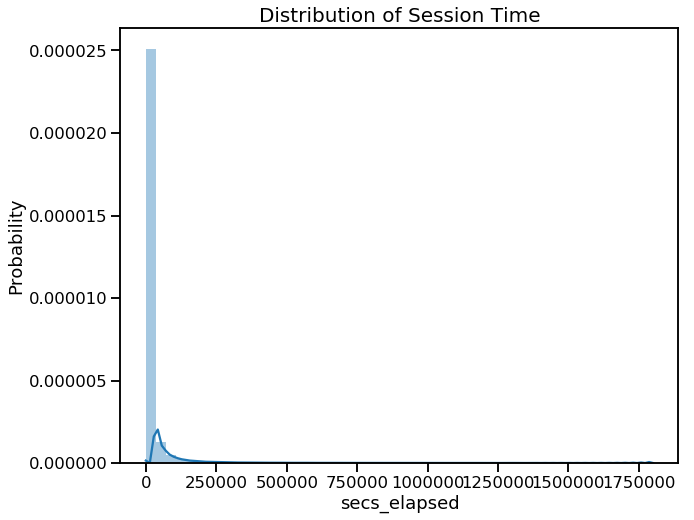

In [65]:
plt.figure(figsize=(10, 8))
sns.distplot(df_session['secs_elapsed'].dropna())
plt.ylabel('Probability')
plt.title('Distribution of Session Time', fontsize=20);

<a id='Data Visualization'></a>

# Data Visualization

Let's try to understand our data more through visualization.

In [65]:
df_first_active = df.groupby(['test', 'first_active_date']).size().reset_index().rename(columns={0: 'count'})
df_first_active['group'] = df_first_active['test'].apply(lambda x: 'Test' if x == 1 else 'Train')

layout = go.Layout(title='No. of First Active over Time', font=dict(size=18), 
                   xaxis=dict(title='Time', titlefont=dict(size=18), 
                              tickfont=dict(size=14)),
                   yaxis=dict(title='No. of first active', 
                              titlefont=dict(size=18), tickfont=dict(size=14)),
                   legend=dict(font=dict(size=10)))
fig = {'data': [{'x': df_first_active[df_first_active['group'] == value]['first_active_date'],
                 'y': df_first_active[df_first_active['group'] == value]['count'], 'name':value, 'mode':'lines'} 
                for value in df_first_active['group'].unique()], 
       'layout': layout}
py.iplot(fig)

In [66]:
print(df[df['test'] == 0]['timestamp_first_active'].max())
print(df[df['test'] == 0]['timestamp_first_active'].min())

2014-06-30 23:58:24
2009-03-19 04:32:55


In [67]:
print(df[df['test'] == 1]['timestamp_first_active'].max())
print(df[df['test'] == 1]['timestamp_first_active'].min())

2014-09-30 23:59:01
2014-07-01 00:00:06


In [68]:
df_acc_created = df.groupby(['test', 'date_account_created']).size().reset_index().rename(columns={0: 'count'})
df_acc_created['group'] = df_acc_created['test'].apply(lambda x: 'Test' if x == 1 else 'Train')

layout = go.Layout(title='No. of Account Created over Time', font=dict(size=18), 
                   xaxis=dict(title='Time', titlefont=dict(size=18), 
                              tickfont=dict(size=14)),
                   yaxis=dict(title='No. of account', 
                              titlefont=dict(size=18), tickfont=dict(size=14)),
                   legend=dict(font=dict(size=10)))
fig = {'data': [{'x': df_acc_created[df_acc_created['group'] == value]['date_account_created'],
                 'y': df_acc_created[df_acc_created['group'] == value]['count'], 'name':value, 'mode': 'lines'}
               for value in df_acc_created['group'].unique()], 
       'layout': layout}
py.iplot(fig)

In [69]:
print(df[df['test'] == 0]['date_account_created'].max())
print(df[df['test'] == 0]['date_account_created'].min())

2014-06-30 00:00:00
2010-01-01 00:00:00


In [70]:
print(df[df['test'] == 1]['date_account_created'].max())
print(df[df['test'] == 1]['date_account_created'].min())

2014-09-30 00:00:00
2014-07-01 00:00:00


In [71]:
df_first_booking = df.groupby(['test', 'date_first_booking']).size().reset_index().rename(columns={0: 'count'})
df_first_booking['group'] = df_first_booking['test'].apply(lambda x: 'Test' if x == 1 else 'Train')

layout = go.Layout(title='No. of First Booking over Time', font=dict(size=18), 
                   xaxis=dict(title='Time', titlefont=dict(size=18), 
                              tickfont=dict(size=14)),
                   yaxis=dict(title='No. of first booking', 
                              titlefont=dict(size=18), tickfont=dict(size=14)),
                   legend=dict(font=dict(size=10)))
fig = {'data': [{'x': df_first_booking[df_first_booking['group'] == value]['date_first_booking'],
                 'y': df_first_booking[df_first_booking['group'] == value]['count'], 'name':value, 'mode': 'lines'}
               for value in df_first_booking['group'].unique()],
       'layout': layout}
py.iplot(fig)

- Training set contains users with first active date and account creation date before 2014-07-01 while test set contains those with first active date and account creation date on or after 2014-07-01.

- Seems like in mid July 2014, there were an influx of new users trying and signing up for Airbnb without actually booking their first trip.

Let's look into these Airbnb users in terms of who they are and where they booked their first trip.

In [72]:
temp = df['country_destination'].value_counts()
trace = go.Bar(x=temp.index, y=temp, marker=dict(color='coral'), opacity=0.6)
data = [trace]
layout = go.Layout(title='Distribution of Destination', titlefont=dict(size=22),
                   xaxis=dict(title='Country',
                              titlefont=dict(size=16),
                              tickfont=dict(size=12)),
                   yaxis=dict(title='Count',
                              titlefont=dict(size=16),
                              tickfont=dict(size=14)))
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

/Users/arielyeung/anaconda2/envs/py365/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



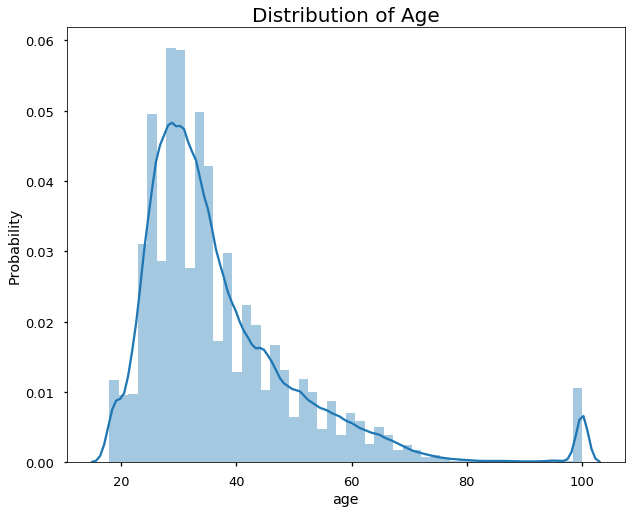

In [204]:
sns.set_context('talk')
plt.figure(figsize=(10, 8))
sns.distplot(df['age'].dropna())
plt.ylabel('Probability')
plt.title('Distribution of Age', fontsize=20);

In [73]:
temp1 = df[df['age'] <= 40]['country_destination'].value_counts() / len(df[df['age'] <= 40])
temp2 = df[df['age'] > 40]['country_destination'].value_counts() / len(df[df['age'] > 40])

trace1 = go.Bar(x=temp1.index, y=temp1, name='<= 40y.o.', marker=dict(color='coral'), opacity=0.6)
trace2 = go.Bar(x=temp2.index, y=temp2, name='> 40y.o.', marker=dict(color='lightblue'), opacity=0.6)

data = [trace1, trace2]
layout = go.Layout(title='Distribution of Destination by Age', titlefont=dict(size=22), barmode='group',
                   xaxis=dict(title='Country',
                              titlefont=dict(size=16),
                              tickfont=dict(size=12)),
                   yaxis=dict(title='Probability',
                              titlefont=dict(size=16),
                              tickfont=dict(size=14)))

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='grouped-bar')

In [74]:
temp = df['gender'].value_counts()
trace = go.Bar(x=temp.index, y=temp, marker=dict(color='coral'), opacity=0.6)
data = [trace]
layout = go.Layout(title='Distribution of Gender', titlefont=dict(size=22),
                   xaxis=dict(title='Gender',
                              titlefont=dict(size=16),
                              tickfont=dict(size=12)),
                   yaxis=dict(title='Count',
                              titlefont=dict(size=16),
                              tickfont=dict(size=14)))
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

In [75]:
temp1 = df[df['gender'] == 'MALE']['country_destination'].value_counts() / len(df[df['gender'] == 'MALE'])
temp2 = df[df['gender'] == 'FEMALE']['country_destination'].value_counts() / len(df[df['gender'] == 'FEMALE'])

trace1 = go.Bar(x=temp1.index, y=temp1, name='Male', marker=dict(color='coral'), opacity=0.6)
trace2 = go.Bar(x=temp2.index, y=temp2, name='Female', marker=dict(color='lightblue'), opacity=0.6)

data = [trace1, trace2]
layout = go.Layout(title='Distribution of Destination by Gender', titlefont=dict(size=22), barmode='group',
                   xaxis=dict(title='Country',
                              titlefont=dict(size=16),
                              tickfont=dict(size=12)),
                   yaxis=dict(title='Probability',
                              titlefont=dict(size=16),
                              tickfont=dict(size=14)))

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='grouped-bar')

- Most users did not end up booking a trip; for those who ended up booking, most of them had their first trip in the U.S.
- The majority of Airbnb users are under 40. Younger users (<= 40 years old) had a higher probability of booking a trip (i.e. lower NDF) than those who are > 40 years old. Younger users were also more likely to pick U.S. as the destination of their first trip.
- We have slightly more female users than male. However, male and female users did not seem to show different preference when picking their destination.

In [76]:
df_session['session_count'] = 1
df_merge = df.merge(pd.DataFrame(df_session.groupby('user_id')['session_count'].
                                 sum()).rename(columns={0:'session_count'}), how='left', 
                    left_on='id', right_index=True)
data = []
for i in df_merge['country_destination'].unique():
    val = df_merge[df_merge['country_destination'] == i]['session_count']
    val = go.Box(y=val, name=i)
    data.append(val)

layout = go.Layout(title='No. of Web Session by Destination', titlefont=dict(size=22),
                   xaxis=dict(title='Country',
                              titlefont=dict(size=16),
                              tickfont=dict(size=12)),
                   yaxis=dict(title='Count',
                              titlefont=dict(size=16),
                              tickfont=dict(size=14)))

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

In [77]:
data = []
for i in df_merge['country_destination'].unique():
    val = df_merge[(df_merge['session_count'] <= 300) & (df_merge['country_destination'] == i)]['session_count']
    val = go.Box(y=val, name=i)
    data.append(val)

layout = go.Layout(title='No. of Web Session by Destination (<= 300 Sessions)', titlefont=dict(size=22),
                   xaxis=dict(title='Country',
                              titlefont=dict(size=16),
                              tickfont=dict(size=12)),
                   yaxis=dict(title='Count',
                              titlefont=dict(size=16),
                              tickfont=dict(size=14)))

fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

In [154]:
df_merge = df.merge(pd.DataFrame(df_session.groupby('user_id')['secs_elapsed'].
                                 mean()).rename(columns={0:'secs_elapsed'}), how='left', 
                    left_on='id', right_index=True)

data = []
for i in df_merge['country_destination'].unique():
    val = df_merge[(df_merge['secs_elapsed'] <= 80000) & (df_merge['country_destination'] == i)]['secs_elapsed']
    val = go.Box(y=val, name=i)
    data.append(val)

layout = go.Layout(title='Web Session Time by Destination (<= 80000 Sec)', titlefont=dict(size=22),
                   xaxis=dict(title='Country',
                              titlefont=dict(size=16),
                              tickfont=dict(size=12)),
                   yaxis=dict(title='Count',
                              titlefont=dict(size=16),
                              tickfont=dict(size=14)))

fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

- Regarding the number and length of web sessions, seems like those who didn't book a trip had less and shorter sessions.

Hypothesis:
- Younger users (<= 40 years old) had a higher probability of booking a trip (i.e. lower NDF) compared to the older users.
- Younger users (<= 40 years old) had a higher probability of booking a trip to the U.S compared to the older users.
- Those who booked a trip had more web sessions.
- Those who booked a trip had shorter web sessions.

<a id='Applying Inferential Statistics'></a>

# Applying Inferential Statistics

## 1. Younger users had a higher probability of booking a trip

Null hypothesis: Probability of younger users (<= 40 years old) booking a trip - Probability of older users (> 40 years old) booking a trip = 0

Alternative hypothesis: Probability of younger users (<= 40 years old) booking a trip - Probability of older users (> 40 years old) booking a trip > 0

And we should use z test because our sample size is > 30.

In [173]:
young = len(df[(df['age'] <= 40) & (df['country_destination'].notnull())])
old = len(df[(df['age'] > 40) & (df['country_destination'].notnull())])
young_book = len(df[(df['age'] <= 40) & (df['country_destination'] != 'NDF') & (df['country_destination'].notnull())])
old_book = len(df[(df['age'] > 40) & (df['country_destination'] != 'NDF') & (df['country_destination'].notnull())])

In [174]:
z_stat, p_value = proportions_ztest([young_book, old_book], [young, old], value=0, alternative='larger')

In [175]:
p_value

7.196754465997219e-68

Since the p-value is very close to 0, we reject the null hypothesis and conclude that younger users had a higher probability of booking a trip.

## 2. Younger users had a higher probability of booking a trip to the U.S.

Null hypothesis: Probability of younger users (<= 40 years old) booking a trip to US - Probability of older users (> 40 years old) booking a trip to US = 0

Alternative hypothesis: Probability of younger users (<= 40 years old) booking a trip to US - Probability of older users (> 40 years old) booking a trip to US > 0

In [176]:
young_US = len(df[(df['age'] <= 40) & (df['country_destination'] == 'US')])
old_US = len(df[(df['age'] > 40) & (df['country_destination'] == 'US')])

In [177]:
z_stat, p_value = proportions_ztest([young_US, old_US], [young, old], value=0, alternative='larger')

In [178]:
p_value

3.4462582761982834e-66

Since the p-value is very close to 0, we reject the null hypothesis and conclude that younger users had a higher probability of booking a trip to the U.S.

## 3. Those who booked a trip had more web sessions

Null hypothesis: Mean number of web sessions among those who booked a trip - Mean number of web sessions among those who did not book a trip = 0

Alternative hypothesis: Mean number of web sessions among those who booked a trip - Mean number of web sessions among those who did not book a trip > 0

In [179]:
df_session['session_count'] = 1
df_merge = df.merge(pd.DataFrame(df_session.groupby('user_id').agg({'session_count':'sum', 'secs_elapsed':'mean'})), 
                    how='left', left_on='id', right_index=True)

In [180]:
z_stat, p_value = ztest(df_merge[(df_merge['country_destination'] != 'NDF') & (df_merge['country_destination'].notnull())]['session_count'].dropna(),
                        df_merge[df_merge['country_destination'] == 'NDF']['session_count'].dropna(), 
                        alternative='larger', value=0)

In [181]:
p_value

5.1181235823355704e-104

Since the p-value is very close to 0, we reject the null hypothesis and conclude that those who booked a trip had more web sessions.

## 4. Those who booked a trip had longer web sessions

Null hypothesis: Mean web session length among those who booked a trip - Mean web session length among those who did not book a trip = 0

Alternative hypothesis: Mean web session length among those who booked a trip - Mean web session length among those who did not book a trip > 0

In [186]:
z_stat, p_value = ztest(df_merge[(df_merge['country_destination'] != 'NDF') & (df['country_destination'].notnull())]['secs_elapsed'].dropna(), 
                        df_merge[df_merge['country_destination'] == 'NDF']['secs_elapsed'].dropna(), 
                        alternative='larger', value=0)

In [187]:
p_value

4.684467608926136e-34

Since the p-value is very close to 0, we reject the null hypothesis and conclude that those who booked a trip had longer web sessions.

<a id='More Data Wrangling'></a>

# More Data Wrangling

In [66]:
df.columns

Index(['affiliate_channel', 'affiliate_provider', 'age', 'country_destination',
       'date_account_created', 'date_first_booking', 'first_affiliate_tracked',
       'first_browser', 'first_device_type', 'gender', 'id', 'language',
       'signup_app', 'signup_flow', 'signup_method', 'test',
       'timestamp_first_active', 'acc_created_year', 'acc_created_month',
       'acc_created_day', 'acc_created_weekday', 'first_active_date',
       'first_active_year', 'first_active_month', 'first_active_day',
       'first_active_weekday', 'diff_acc_active'],
      dtype='object')

In [67]:
df.isnull().sum() / len(df)

affiliate_channel          0.000000
affiliate_provider         0.000000
age                        0.424124
country_destination        0.225355
date_account_created       0.000000
date_first_booking         0.677340
first_affiliate_tracked    0.022083
first_browser              0.161112
first_device_type          0.000000
gender                     0.469902
id                         0.000000
language                   0.000004
signup_app                 0.000000
signup_flow                0.000000
signup_method              0.000000
test                       0.000000
timestamp_first_active     0.000000
acc_created_year           0.000000
acc_created_month          0.000000
acc_created_day            0.000000
acc_created_weekday        0.000000
first_active_date          0.000000
first_active_year          0.000000
first_active_month         0.000000
first_active_day           0.000000
first_active_weekday       0.000000
diff_acc_active            0.000000
dtype: float64

In [97]:
df_impute = df.drop(columns=['country_destination', 'date_account_created', 'date_first_booking', 'id', 'test',
                             'timestamp_first_active', 'first_active_date'])

In [98]:
df_impute['age_nan'] = df_impute['age'].isnull() * 1
df_impute['gender_nan'] = df_impute['gender'].isnull() * 1

In [99]:
df_impute = pd.get_dummies(df_impute, columns=['affiliate_channel', 'affiliate_provider', 'first_affiliate_tracked',
                                               'first_browser', 'first_device_type', 'language', 'signup_app', 
                                               'signup_method', 'acc_created_year', 'acc_created_month', 
                                               'acc_created_day', 'acc_created_weekday', 'first_active_year', 
                                               'first_active_month', 'first_active_day', 'first_active_weekday'], 
                           drop_first=True, dummy_na=True)

In [100]:
df_impute = pd.get_dummies(df_impute, columns=['gender'], drop_first=True)

In [105]:
df_impute['gender_MALE'] = np.where(df_impute['gender_nan'] == 1, np.nan, df_impute['gender_MALE'])

In [107]:
df_impute.head()

,age,signup_flow,diff_acc_active,age_nan,gender_nan,affiliate_channel_content,affiliate_channel_direct,affiliate_channel_other,affiliate_channel_remarketing,affiliate_channel_sem-brand,...,first_active_day_nan,first_active_weekday_1.0,first_active_weekday_2.0,first_active_weekday_3.0,first_active_weekday_4.0,first_active_weekday_5.0,first_active_weekday_6.0,first_active_weekday_nan,gender_MALE,gender_OTHER
0,NaN,0,465,1,1,0,1,0,0,0,...,0,0,0,1,0,0,0,0,NaN,0
1,38.0,0,731,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1.0,0
2,56.0,3,418,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0.0,0
3,42.0,0,764,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0.0,0
4,41.0,0,71,0,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,NaN,0


In [108]:
df_impute.shape

(275547, 247)

In [109]:
df_filled = df_impute.as_matrix()

/Users/arielyeung/anaconda2/envs/py365/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



In [110]:
df_filled = pd.DataFrame(IterativeImputer().fit_transform(df_filled))
df_filled.columns = df_impute.columns

In [111]:
df_filled['age_bucket'] = pd.cut(df_filled['age'], 
                                 [0, 4.5, 9.5, 14.5, 19.5, 24.5, 29.5, 34.5, 39.5, 44.5, 49.5, 54.5, 59.5, 64.5, 
                                  69.5, 74.5, 79.5, 84.5, 89.5, 94.5, 99.5, 100],
                                 labels=['0-4', '5-9', '10-14', '15-19', '20-24', '25-29', '30-34', '35-39', 
                                         '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', 
                                         '80-84', '85-89', '90-94', '95-99', '100+'])

In [112]:
df_filled.head()

,age,signup_flow,diff_acc_active,age_nan,gender_nan,affiliate_channel_content,affiliate_channel_direct,affiliate_channel_other,affiliate_channel_remarketing,affiliate_channel_sem-brand,...,first_active_weekday_1.0,first_active_weekday_2.0,first_active_weekday_3.0,first_active_weekday_4.0,first_active_weekday_5.0,first_active_weekday_6.0,first_active_weekday_nan,gender_MALE,gender_OTHER,age_bucket
0,29.564513,0.0,465.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.321867,0.0,30-34
1,38.000000,0.0,731.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.000000,0.0,35-39
2,56.000000,3.0,418.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,55-59
3,42.000000,0.0,764.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.000000,0.0,40-44
4,41.000000,0.0,71.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.651177,0.0,40-44


In [114]:
df_filled['gender'] = df_filled['gender_MALE'].apply(lambda x : 'MALE' if x >= 0.5 else 'FEMALE')

In [116]:
df_filled = pd.concat([df_filled, df[['country_destination', 'id', 'test', 'language']].reset_index(drop=True)], 
                      axis=1)

<a id='Merging Data'></a>

# Merging Data

In [117]:
df_merge = df_filled.merge(df_age_gen2, how='left', on=['age_bucket', 'gender'])

In [118]:
df_merge.head()

,age,signup_flow,diff_acc_active,age_nan,gender_nan,affiliate_channel_content,affiliate_channel_direct,affiliate_channel_other,affiliate_channel_remarketing,affiliate_channel_sem-brand,...,AU,CA,DE,ES,FR,GB,IT,NL,PT,US
0,29.564513,0.0,465.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,...,3.615767,3.456831,3.114023,3.487067,3.148516,3.308271,2.929103,2.949905,3.412197,3.341105
1,38.000000,0.0,731.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.331522,3.314655,2.965044,4.484884,2.834588,3.099937,3.462262,2.908357,3.949477,3.176864
2,56.000000,3.0,418.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,3.089077,3.638036,3.628788,3.243438,3.270086,3.118734,3.383760,3.442545,3.449901,3.464439
3,42.000000,0.0,764.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,3.502905,3.258900,3.099489,4.076012,3.433206,3.363095,3.943086,3.460351,3.940051,3.170405
4,41.000000,0.0,71.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,3.427664,3.286778,3.189118,4.347181,3.403967,3.291040,3.970889,3.454416,3.921199,3.124577


In [119]:
len(df) == len(df_merge)

True

In [120]:
lang_dict = {'AU_lang':'en', 'CA_lang':'en', 'DE_lang':'de', 'ES_lang':'es', 'FR_lang':'fr', 'GB_lang':'en',
             'IT_lang':'it', 'NL_lang':'nl', 'PT_lang':'pt', 'US_lang':'en'}

for k, v in lang_dict.items():
    df_merge[k] = (df_merge['language'] == v) * 1

In [121]:
df_merge.columns

Index(['age', 'signup_flow', 'diff_acc_active', 'age_nan', 'gender_nan',
       'affiliate_channel_content', 'affiliate_channel_direct',
       'affiliate_channel_other', 'affiliate_channel_remarketing',
       'affiliate_channel_sem-brand',
       ...
       'AU_lang', 'CA_lang', 'DE_lang', 'ES_lang', 'FR_lang', 'GB_lang',
       'IT_lang', 'NL_lang', 'PT_lang', 'US_lang'],
      dtype='object', length=273)

In [155]:
df_session.head()

,user_id,action,action_type,action_detail,device_type,secs_elapsed
0,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,319.0
1,d1mm9tcy42,search_results,click,view_search_results,Windows Desktop,67753.0
2,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,301.0
3,d1mm9tcy42,search_results,click,view_search_results,Windows Desktop,22141.0
4,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,435.0


In [124]:
df_session2 = df_session.groupby('user_id').agg({'action':['count', 'nunique'], 'action_type':'nunique', 
                                                 'action_detail':'nunique', 'device_type':'nunique',
                                                 'secs_elapsed':['sum', 'mean', 'min', 'max', 'median', 'std', 
                                                                 'skew', pd.DataFrame.kurt]})

In [125]:
df_session2.columns = ['_'.join(col) for col in df_session2.columns]

In [126]:
df_session2.head()

,action_count,action_nunique,action_type_nunique,action_detail_nunique,device_type_nunique,secs_elapsed_sum,secs_elapsed_mean,secs_elapsed_min,secs_elapsed_max,secs_elapsed_median,secs_elapsed_std,secs_elapsed_skew,secs_elapsed_kurt
user_id,,,,,,,,,,,,,
00023iyk9l,38,12,5,12,2,867896.0,22253.743590,0.0,567165.0,850.0,92242.561900,5.751871,34.340670
0010k6l0om,62,10,3,6,1,586543.0,9460.370968,3.0,127898.0,948.5,22751.227918,3.606181,14.373464
001wyh0pz8,89,9,4,7,1,282965.0,3179.382022,35.0,50548.0,1105.0,6569.648182,4.974841,31.295751
0028jgx1x1,30,4,3,4,0,297010.0,9900.333333,3.0,84636.0,1614.0,18004.964337,2.961825,10.184989
002qnbzfs5,781,25,6,21,1,6487080.0,8232.335025,0.0,1418284.0,498.0,58110.646170,19.461157,448.815907


In [127]:
df_session2.fillna(0, inplace=True)

In [128]:
df_session2.isnull().sum()

action_count             0
action_nunique           0
action_type_nunique      0
action_detail_nunique    0
device_type_nunique      0
secs_elapsed_sum         0
secs_elapsed_mean        0
secs_elapsed_min         0
secs_elapsed_max         0
secs_elapsed_median      0
secs_elapsed_std         0
secs_elapsed_skew        0
secs_elapsed_kurt        0
dtype: int64

In [129]:
df_session3 = pd.get_dummies(df_session[['user_id', 'action']], columns=['action'], dummy_na=True)

In [130]:
df_session3 = df_session3.groupby('user_id').agg(['sum', 'mean'])

In [131]:
df_session3.isnull().sum().sum()

0

In [132]:
df_session3.columns = ['_'.join(col) for col in df_session3.columns]

In [133]:
df_session4 = df_session2.merge(df_session3, left_index=True, right_index=True, how='outer')

In [134]:
df_session4.head()

,action_count,action_nunique,action_type_nunique,action_detail_nunique,device_type_nunique,secs_elapsed_sum,secs_elapsed_mean,secs_elapsed_min,secs_elapsed_max,secs_elapsed_median,...,action_why_host_sum,action_why_host_mean,action_widget_sum,action_widget_mean,action_wishlists_sum,action_wishlists_mean,action_zendesk_login_jwt_sum,action_zendesk_login_jwt_mean,action_nan_sum,action_nan_mean
user_id,,,,,,,,,,,,,,,,,,,,,
00023iyk9l,38,12,5,12,2,867896.0,22253.743590,0.0,567165.0,850.0,...,0,0.0,0,0.0,0,0.0,0,0.0,1.0,0.025641
0010k6l0om,62,10,3,6,1,586543.0,9460.370968,3.0,127898.0,948.5,...,0,0.0,0,0.0,0,0.0,0,0.0,0.0,0.000000
001wyh0pz8,89,9,4,7,1,282965.0,3179.382022,35.0,50548.0,1105.0,...,0,0.0,0,0.0,0,0.0,0,0.0,0.0,0.000000
0028jgx1x1,30,4,3,4,0,297010.0,9900.333333,3.0,84636.0,1614.0,...,0,0.0,0,0.0,0,0.0,0,0.0,0.0,0.000000
002qnbzfs5,781,25,6,21,1,6487080.0,8232.335025,0.0,1418284.0,498.0,...,0,0.0,0,0.0,0,0.0,0,0.0,7.0,0.008883


In [135]:
df_merge2 = df_merge.merge(df_session4, how='left', left_on='id', right_index=True)

In [136]:
df_merge2.columns[df_merge2.isnull().sum() > 0]

Index(['country_destination', 'language', 'action_count', 'action_nunique',
       'action_type_nunique', 'action_detail_nunique', 'device_type_nunique',
       'secs_elapsed_sum', 'secs_elapsed_mean', 'secs_elapsed_min',
       ...
       'action_why_host_sum', 'action_why_host_mean', 'action_widget_sum',
       'action_widget_mean', 'action_wishlists_sum', 'action_wishlists_mean',
       'action_zendesk_login_jwt_sum', 'action_zendesk_login_jwt_mean',
       'action_nan_sum', 'action_nan_mean'],
      dtype='object', length=735)

In [138]:
df_merge2.fillna(0, inplace=True)

In [1]:
df_merge2.to_csv('clean_df2.csv')

In [2]:
df_merge2 = pd.read_csv('clean_df2.csv')

In [3]:
train = df_merge2[df_merge2['test'] == 0]
test = df_merge2[df_merge2['test'] == 1]

In [4]:
train.drop(columns=['Unnamed: 0', 'test', 'gender', 'age_bucket', 'language'], inplace=True)
test.drop(columns=['Unnamed: 0', 'test', 'gender', 'age_bucket', 'country_destination', 'language'], inplace=True)

<a id='Evaluation Metric'></a>

# Evaluation Metric

In [5]:
def dcg_score(y_true, y_score, k=5):
    
    order = np.argsort(y_score)[::-1]
    y_true = np.take(y_true, order[:k])

    gain = 2 ** y_true - 1

    discounts = np.log2(np.arange(len(y_true)) + 2)
    return np.sum(gain / discounts)


def ndcg_score(ground_truth, predictions, k=5):

    lb = LabelBinarizer()
    lb.fit(range(len(predictions) + 1))
    T = lb.transform(ground_truth)

    scores = []

    for y_true, y_score in zip(T, predictions):
        actual = dcg_score(y_true, y_score, k)
        best = dcg_score(y_true, y_true, k)
        score = float(actual) / float(best)
        scores.append(score)

    return np.mean(scores)

In [ ]:
ndcg_scorer = make_scorer(ndcg_score, needs_proba=True, k=5)

<a id='Modeling'></a>

# Modeling

In [6]:
country_dict = {'NDF': 0, 'US': 1, 'FR': 2, 'CA': 3, 'GB': 4, 'ES': 5, 'IT': 6, 'PT': 7, 'NL': 8,
                'DE': 9, 'AU': 10, 'other': 11}

In [7]:
train['country_code'] =  train['country_destination'].map(country_dict)

In [8]:
X = train.drop(columns=['country_destination', 'country_code'])
Y = train[['id', 'country_code']]

In [9]:
X = X.set_index('id')
Y = Y.set_index('id')

## Random Forest

### Grid Search

In [11]:
rf = RandomForestClassifier(n_estimators=200)

In [16]:
param_grid = {'max_features' : ['auto', 'log2'], 
              'min_samples_split' : [0.0005, 0.0006]}
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, scoring=ndcg_scorer, verbose=2)
grid_search.fit(X, Y['country_code'])

Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV] max_features=auto, min_samples_split=0.0005 .....................
[CV] ...... max_features=auto, min_samples_split=0.0005, total= 2.4min
[CV] max_features=auto, min_samples_split=0.0005 .....................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  5.1min remaining:    0.0s


[CV] ...... max_features=auto, min_samples_split=0.0005, total= 2.3min
[CV] max_features=auto, min_samples_split=0.0005 .....................
[CV] ...... max_features=auto, min_samples_split=0.0005, total= 2.2min
[CV] max_features=auto, min_samples_split=0.0006 .....................
[CV] ...... max_features=auto, min_samples_split=0.0006, total= 2.3min
[CV] max_features=auto, min_samples_split=0.0006 .....................
[CV] ...... max_features=auto, min_samples_split=0.0006, total= 2.3min
[CV] max_features=auto, min_samples_split=0.0006 .....................
[CV] ...... max_features=auto, min_samples_split=0.0006, total= 2.5min
[CV] max_features=log2, min_samples_split=0.0005 .....................
[CV] ...... max_features=log2, min_samples_split=0.0005, total= 1.6min
[CV] max_features=log2, min_samples_split=0.0005 .....................
[CV] ...... max_features=log2, min_samples_split=0.0005, total= 1.6min
[CV] max_features=log2, min_samples_split=0.0005 .....................
[CV] .

[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed: 55.2min finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=0.0006,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_features': ['auto', 'log2'], 'min_samples_split': [0.0005, 0.0006]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(ndcg_score, needs_proba=True, k=5), verbose=2)

In [17]:
print(grid_search.best_params_)

{'max_features': 'auto', 'min_samples_split': 0.0005}


### Final Model

In [18]:
rf = RandomForestClassifier(n_estimators=200, min_samples_split=0.0005)
rf.fit(X, Y)

/Users/arielyeung/anaconda2/envs/py365/lib/python3.6/site-packages/ipykernel_launcher.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=0.0005,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [67]:
importance_df = pd.DataFrame(rf.feature_importances_, X_train.columns, columns=['Importance'])
importance_df = importance_df.sort_values(by=['Importance'], ascending=False)[:15]

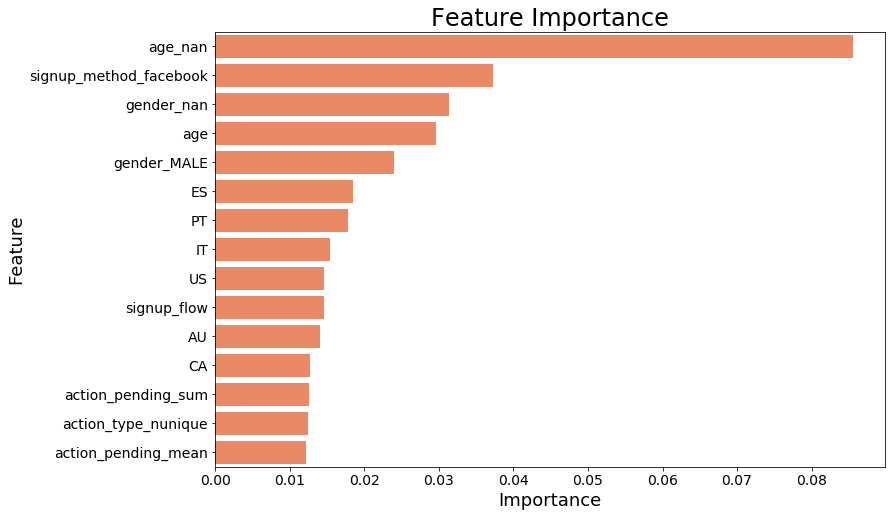

In [68]:
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y=importance_df.index, data=importance_df, color='coral')
plt.title('Feature Importance', fontsize=24)
plt.xlabel('Importance', fontsize=18)
plt.ylabel('Feature', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

### Prediction

In [19]:
test = test.set_index('id')

In [20]:
pred_prob = pd.DataFrame(rf.predict_proba(test), index=test.index)
pred_prob.columns = ['NDF', 'US', 'FR', 'CA', 'GB', 'ES', 'IT', 'PT', 'NL', 'DE', 'AU', 'other']

In [21]:
arr = np.argsort(-pred_prob.values, axis=1)
top5 = pd.DataFrame(pred_prob.columns[arr], index=pred_prob.index).reset_index().iloc[:, 0:6]

In [22]:
result = pd.melt(top5, id_vars='id', value_vars=[0, 1, 2, 3, 4], var_name='order', value_name='country')
result = result.sort_values(by=['id', 'order'])

In [23]:
result.drop(columns=['order'], inplace=True)

In [25]:
result.to_csv('rf.csv', index=False)

## XGBoost

### Model

In [10]:
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(X, Y, test_size=0.3, random_state=6)

In [91]:
dtrain = xgb.DMatrix(X_train, label=Y_train.values)
dtest = xgb.DMatrix(X_test, label=Y_test.values)

In [132]:
num_round = 40

In [93]:
params = {}
params['objective'] = 'multi:softprob'
params['eval_metric'] = 'mlogloss'
params['num_class'] = 12

In [94]:
watchlist = [(dtrain, 'train'), (dtest, 'test') ]

In [114]:
evals_result = {}

In [133]:
xgboost = xgb.train(params, dtrain, num_round, evals=watchlist, early_stopping_rounds=5, evals_result=evals_result)

[20:59:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 110 extra nodes, 0 pruned nodes, max_depth=6
[20:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 106 extra nodes, 0 pruned nodes, max_depth=6
[20:59:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 0 pruned nodes, max_depth=6
[20:59:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=6
[21:00:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 60 extra nodes, 0 pruned nodes, max_depth=6
[21:00:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54 extra nodes, 0 pruned nodes, max_depth=6
[21:00:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 0 pruned nodes, max_depth=6
[21:00:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 pruned nodes, max_depth=6
[21:00:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, ma

[21:12:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=6
[21:12:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 94 extra nodes, 0 pruned nodes, max_depth=6
[5]	train-mlogloss:1.15878	test-mlogloss:1.16956
[21:13:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 120 extra nodes, 0 pruned nodes, max_depth=6
[21:13:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 102 extra nodes, 0 pruned nodes, max_depth=6
[21:13:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 78 extra nodes, 0 pruned nodes, max_depth=6
[21:13:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=6
[21:13:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 84 extra nodes, 0 pruned nodes, max_depth=6
[21:13:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 104 extra nodes, 0 pruned nodes, max_depth=6
[21:13:52] src/tree/updater_prune.cc:74: tree prunin

[21:24:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 80 extra nodes, 0 pruned nodes, max_depth=6
[21:24:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=6
[21:24:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 0 pruned nodes, max_depth=6
[11]	train-mlogloss:1.03258	test-mlogloss:1.05651
[21:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 118 extra nodes, 0 pruned nodes, max_depth=6
[21:25:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 0 pruned nodes, max_depth=6
[21:25:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 90 extra nodes, 0 pruned nodes, max_depth=6
[21:25:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=6
[21:25:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 0 pruned nodes, max_depth=6
[21:26:04] src/tree/updater_prune.cc:74: tree pruning

[21:36:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=6
[21:37:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 80 extra nodes, 0 pruned nodes, max_depth=6
[21:37:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 76 extra nodes, 0 pruned nodes, max_depth=6
[21:37:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 76 extra nodes, 0 pruned nodes, max_depth=6
[17]	train-mlogloss:0.99559	test-mlogloss:1.0333
[21:37:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=6
[21:38:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 108 extra nodes, 0 pruned nodes, max_depth=6
[21:38:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 0 pruned nodes, max_depth=6
[21:38:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=6
[21:38:25] src/tree/updater_prune.cc:74: tree pruning 

[21:49:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=6
[21:49:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 70 extra nodes, 0 pruned nodes, max_depth=6
[21:49:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 70 extra nodes, 0 pruned nodes, max_depth=6
[21:49:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 0 pruned nodes, max_depth=6
[21:49:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=6
[23]	train-mlogloss:0.977653	test-mlogloss:1.02805
[21:50:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=6
[21:50:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra nodes, 0 pruned nodes, max_depth=6
[21:50:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 60 extra nodes, 0 pruned nodes, max_depth=6
[21:50:43] src/tree/updater_prune.cc:74: tree pruning

[22:01:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 0 pruned nodes, max_depth=6
[22:01:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=6
[22:01:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=6
[22:02:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 0 pruned nodes, max_depth=6
[22:02:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=6
[22:02:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 0 pruned nodes, max_depth=6
[29]	train-mlogloss:0.964993	test-mlogloss:1.02678
[22:02:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 94 extra nodes, 0 pruned nodes, max_depth=6
[22:03:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=6
[22:03:21] src/tree/updater_prune.cc:74: tree pruning

[22:14:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=6
[22:14:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=6
[22:14:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=6
[22:14:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=6
[22:14:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=6
[22:15:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=6
[22:15:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=6
[35]	train-mlogloss:0.954736	test-mlogloss:1.02634
[22:15:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 88 extra nodes, 0 pruned nodes, max_depth=6
[22:15:57] src/tree/updater_prune.cc:74: tree pruning

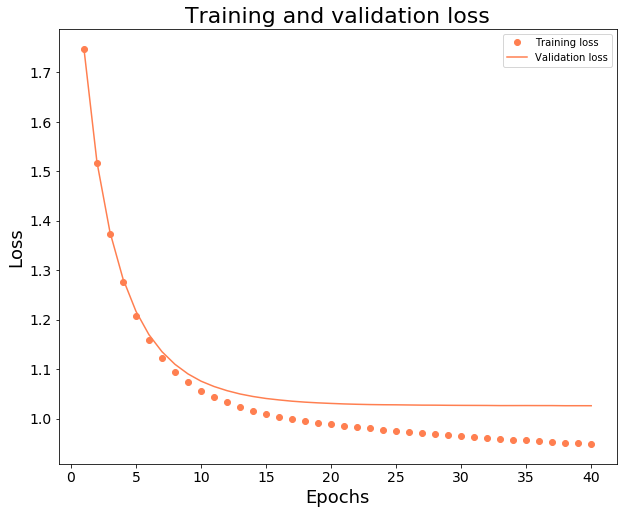

In [149]:
epochs = range(1, len((evals_result)['train']['mlogloss']) + 1)

fig = plt.figure(figsize=(10, 8))
_ = plt.plot(epochs, evals_result['train']['mlogloss'], 'bo', label='Training loss', color='coral')
_ = plt.plot(epochs, evals_result['test']['mlogloss'], 'b', label='Validation loss', color='coral')
_ = plt.title('Training and validation loss', fontsize=22)
_ = plt.xlabel('Epochs', fontsize=18)
_ = plt.ylabel('Loss', fontsize=18)
_ = plt.xticks(fontsize=14)
_ = plt.yticks(fontsize=14)
_ = plt.legend()

plt.show()

### Prediction

In [143]:
dtest2 = xgb.DMatrix(test)

In [144]:
pred_prob = pd.DataFrame(xgboost.predict(dtest2, ntree_limit=xgboost.best_iteration + 1), index=test.index)
pred_prob.columns = ['NDF', 'US', 'FR', 'CA', 'GB', 'ES', 'IT', 'PT', 'NL', 'DE', 'AU', 'other']

In [145]:
arr = np.argsort(-pred_prob.values, axis=1)
top5 = pd.DataFrame(pred_prob.columns[arr], index=pred_prob.index).reset_index().iloc[:, 0:6]

In [146]:
result = pd.melt(top5, id_vars='id', value_vars=[0, 1, 2, 3, 4], var_name='order', value_name='country')
result = result.sort_values(by=['id', 'order'])

In [147]:
result.drop(columns=['order'], inplace=True)

In [148]:
result.to_csv('xgb3.csv', index=False)

## Neural Networks

### Model

In [122]:
X_nn = preprocessing.normalize(X, axis=0)

In [123]:
Y_nn = pd.get_dummies(Y, columns=['country_code'])

In [164]:
model = Sequential()
model.add(Dense(250, activation='relu', input_dim=1000))
model.add(Dense(125, activation='relu'))
model.add(Dense(125, activation='relu'))
model.add(Dense(12, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', 'categorical_accuracy'])

In [165]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, verbose=1) 

In [166]:
history = model.fit(X_nn, Y_nn, batch_size=50, epochs=20, verbose=1, validation_split=0.3, 
                    callbacks=[early_stop])

Train on 149415 samples, validate on 64036 samples
Epoch 1/20
149415/149415 [==============================] - 21s 142us/step - loss: 1.1654 - acc: 0.5797 - categorical_accuracy: 0.5797 - val_loss: 0.9793 - val_acc: 0.6729 - val_categorical_accuracy: 0.6729
Epoch 2/20
149415/149415 [==============================] - 18s 120us/step - loss: 1.1065 - acc: 0.6026 - categorical_accuracy: 0.6026 - val_loss: 0.9653 - val_acc: 0.6850 - val_categorical_accuracy: 0.6850
Epoch 3/20
149415/149415 [==============================] - 16s 105us/step - loss: 1.0966 - acc: 0.6140 - categorical_accuracy: 0.6140 - val_loss: 0.9618 - val_acc: 0.6846 - val_categorical_accuracy: 0.6846
Epoch 4/20
149415/149415 [==============================] - 16s 110us/step - loss: 1.0921 - acc: 0.6185 - categorical_accuracy: 0.6185 - val_loss: 0.9687 - val_acc: 0.6909 - val_categorical_accuracy: 0.6909
Epoch 5/20
149415/149415 [==============================] - 19s 125us/step - loss: 1.0890 - acc: 0.6197 - categorical_acc

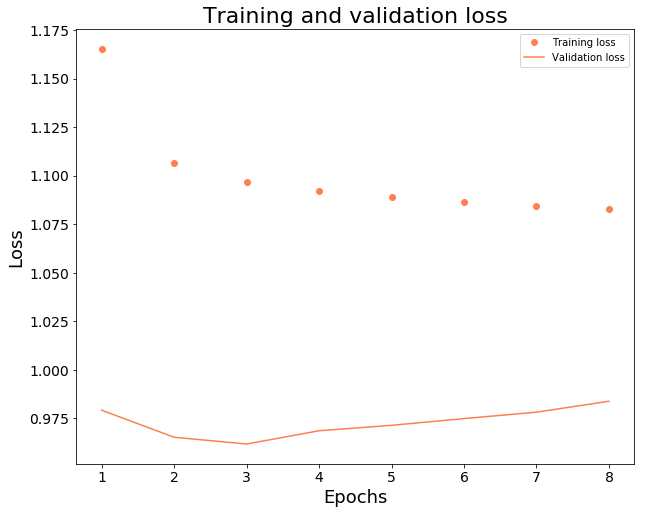

In [167]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

# "bo" is for "blue dot"
fig = plt.figure(figsize=(10, 8))
_ = plt.plot(epochs, loss, 'bo', label='Training loss', color='coral')
# b is for "solid blue line"
_ = plt.plot(epochs, val_loss, 'b', label='Validation loss', color='coral')
_ = plt.title('Training and validation loss', fontsize=22)
_ = plt.xlabel('Epochs', fontsize=18)
_ = plt.ylabel('Loss', fontsize=18)
_ = plt.xticks(fontsize=14)
_ = plt.yticks(fontsize=14)
##_ = plt.ylim([0, 0.3])
_ = plt.legend()

plt.show()

### Prediction

In [168]:
test_nn = preprocessing.normalize(test, axis=0)

In [169]:
pred_prob = pd.DataFrame(model.predict_proba(test_nn), index=test.index)
pred_prob.columns = ['NDF', 'US', 'FR', 'CA', 'GB', 'ES', 'IT', 'PT', 'NL', 'DE', 'AU', 'other']

In [170]:
pred_prob.head()

,NDF,US,FR,CA,GB,ES,IT,PT,NL,DE,AU,other
id,,,,,,,,,,,,
5uwns89zht,0.923477,0.061421,0.002013,0.000617,0.000831,0.000789,0.001259,0.000055,0.000230,0.000446,0.000273,0.008588
jtl0dijy2j,0.982906,0.012619,0.000781,0.000186,0.000236,0.000234,0.000452,0.000016,0.000060,0.000108,0.000071,0.002331
xx0ulgorjt,0.990174,0.005554,0.000638,0.000118,0.000178,0.000232,0.000370,0.000014,0.000049,0.000067,0.000055,0.002552
6c6puo6ix0,0.987869,0.007389,0.000777,0.000151,0.000218,0.000273,0.000456,0.000016,0.000058,0.000084,0.000062,0.002647
czqhjk3yfe,0.346073,0.464641,0.043353,0.009964,0.013925,0.015174,0.018895,0.001206,0.005121,0.009817,0.003691,0.068140


In [171]:
arr = np.argsort(-pred_prob.values, axis=1)
top5 = pd.DataFrame(pred_prob.columns[arr], index=pred_prob.index).reset_index().iloc[:, 0:6]

In [172]:
result = pd.melt(top5, id_vars='id', value_vars=[0, 1, 2, 3, 4], var_name='order', value_name='country')
result = result.sort_values(by=['id', 'order'])

In [173]:
result.drop(columns=['order'], inplace=True)

In [174]:
result.to_csv('nn2.csv', index=False)

## Ensemble

In [34]:
rf_prob = pd.DataFrame(rf.predict_proba(test), index=test.index)
rf_prob.columns = ['NDF', 'US', 'FR', 'CA', 'GB', 'ES', 'IT', 'PT', 'NL', 'DE', 'AU', 'other']

In [35]:
rf_prob.to_csv('rf_prob.csv')

In [151]:
xgb_prob = pd.DataFrame(xgboost.predict(dtest2, ntree_limit=xgboost.best_iteration + 1), index=test.index)
xgb_prob.columns = ['NDF', 'US', 'FR', 'CA', 'GB', 'ES', 'IT', 'PT', 'NL', 'DE', 'AU', 'other']

In [152]:
xgb_prob.to_csv('xgb_prob3.csv')

In [158]:
nn_prob = pd.DataFrame(model.predict_proba(test_nn), index=test.index)
nn_prob.columns = ['NDF', 'US', 'FR', 'CA', 'GB', 'ES', 'IT', 'PT', 'NL', 'DE', 'AU', 'other']

In [162]:
nn_prob.to_csv('nn_prob.csv')

In [153]:
rf_prob = pd.read_csv('rf_prob.csv', index_col='id')
xgb_prob = pd.read_csv('xgb_prob3.csv', index_col='id')
nn_prob = pd.read_csv('nn_prob.csv', index_col='id')

In [157]:
ave_prob = rf_prob.add(2 * xgb_prob, fill_value=0)

In [158]:
ave_prob = ave_prob.add(nn_prob, fill_value=0)

In [159]:
ave_prob.head()

,NDF,US,FR,CA,GB,ES,IT,PT,NL,DE,AU,other
id,,,,,,,,,,,,
5uwns89zht,3.198777,0.605858,0.032691,0.004651,0.017490,0.014788,0.019917,0.000776,0.005004,0.002949,0.003347,0.093753
jtl0dijy2j,3.786402,0.138299,0.012218,0.001089,0.003878,0.004154,0.010083,0.000529,0.000720,0.001086,0.001630,0.039911
xx0ulgorjt,3.789000,0.128899,0.020222,0.005698,0.005538,0.007263,0.008491,0.000622,0.000961,0.001113,0.000771,0.031419
6c6puo6ix0,3.683955,0.193301,0.028689,0.003680,0.005743,0.009125,0.011541,0.001329,0.005146,0.001830,0.000808,0.054851
czqhjk3yfe,0.636422,2.571588,0.166536,0.048155,0.072624,0.070230,0.104182,0.011226,0.021534,0.017921,0.010339,0.269242


In [160]:
ave_prob = ave_prob / 4

In [161]:
arr = np.argsort(-ave_prob.values, axis=1)
top5 = pd.DataFrame(ave_prob.columns[arr], index=ave_prob.index).reset_index().iloc[:, 0:6]

In [162]:
result = pd.melt(top5, id_vars='id', value_vars=[0, 1, 2, 3, 4], var_name='order', value_name='country')
result = result.sort_values(by=['id', 'order'])

In [163]:
result.drop(columns=['order'], inplace=True)
result.to_csv('ensemble.csv', index=False)

# Result

In [176]:
Model = ['Random Forest', 'XGBoost', 'Neural Networks', 'Ensemble']

In [177]:
NDCG = [0.87521, 0.87837, 0.87414, 0.8780]